## Mini Project: Solar Exposure and Land Real Estate Opportunity

## The Problem: Australians are going to be at risk of power shortages and blackouts in future. Factors include the closing of power stations such as Liddell in 2022. There is no significant investment in power generation for Australia currently planned and more power plants will be closing without suitable replacements. -2019

"Up to 1.3 million households in Victoria are at risk of blackouts during heatwaves this coming summer if no extra power generation is secured and two power plant outages last longer than expected, the Australian Energy Market Operator has found" -Australian Financial Review 22 Aug 2019


## The Question: What real estate opportunity is there in Australia to build the most cost effective solar farm?

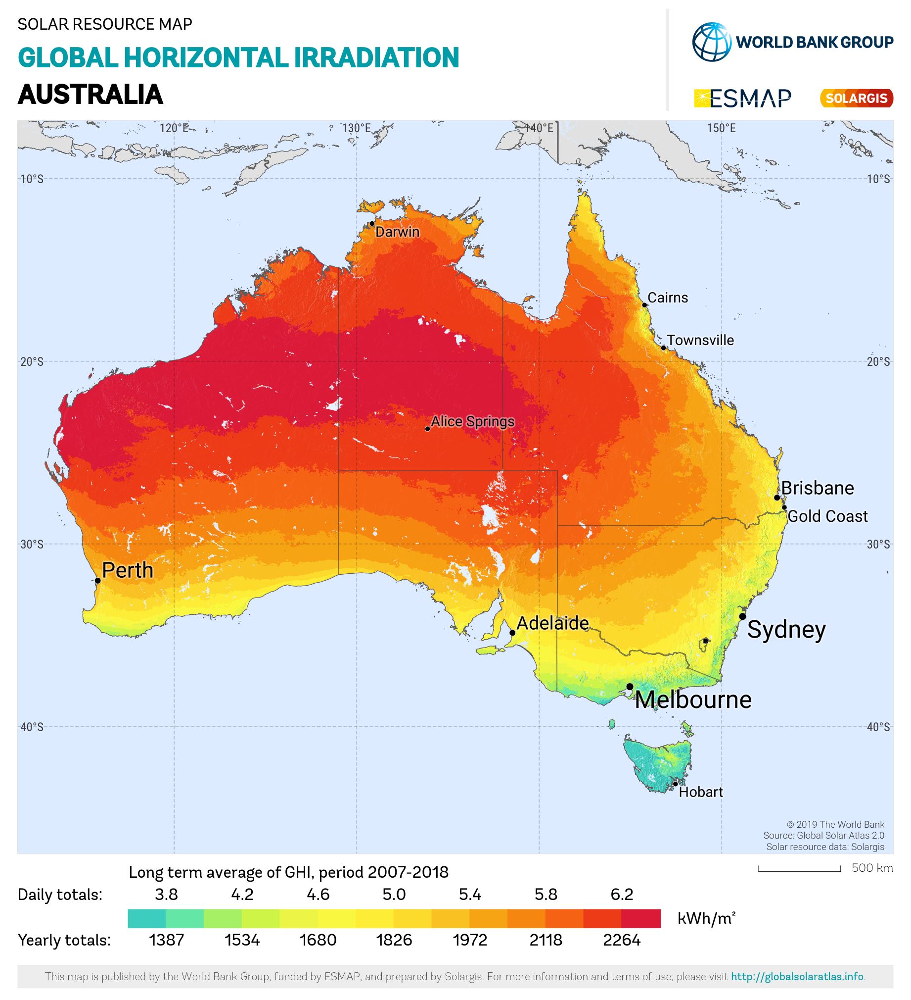

Data examined:
- Current March 2020 commercial real estate of rural and farm land in Australia
- Annual 2019 solar irradiance in Australia

Facts:
- Use farms use what is called solar photovoltaics panels to convert irradiation into electricity
- 1 megawatt (MW) can supply 200 households
- 1 megajoule = 0.000277778 megawatt-hour
- One MW is equal to one million watts or one thousand kilowatts, so we're talking about a very large amount of energy. As a general rule of thumb, each MW of a coal power station's capacity can supply around 650 average homes

Assumptions:
- 50 to 70% of solar irradiance can be converted to useful energy
- Cost \\$1/watt, so 1MW = \\$1million cost to install
- In 2017, the average wholesale price of a Megawatt hour in the middle of the US is \~$31 or \\$46 AUD
- 2 SqM for one panel

Further exploration: 
- Other forms of renewable energy such as wind energy 
- Solar farms can be co-located with wind farms or rain capture farms
- How would you store energy?
- How would you transfer energy?
- Residential
- What is the current envionrment of solar farms look like?
- What is the maximum capacity that a solar grid can store?
- What is the cap on sun exposuren needed?
- Use realestate.com.au API?
- What is the benchmark
- Sun Cable Project (transferring energy under water, ie Aus to Singapore)

## The Conclusion First: According to the initial data Queensland would be the optimal place to build a solar farm given it's highest sun light exposure ratio to cheapest land price

In [2]:
import numpy as np
import pandas as pd

print('Numpy: ', np.__version__)
print('Pandas: ', pd.__version__)

Numpy:  1.17.2
Pandas:  0.25.1


In [3]:
solar = pd.read_csv('../DATA/land_and_solar.csv')
solar.head()

,State,Area Code,City,Address,Address Two,Size (hectare),sq metres,Price,Price / Sq Metre,Solar Exposure 2019 (MJ m-2),Convert to megawatt-hour,Total Megawatt-hour,60%,Solar / PSM,Unnamed: 14
0,QLD,4725,Barcaldine,0 Capricorn Highway,0 Capricorn Highway Barcaldine 4725,168.59,"1,685,900",400000,0.24,21.8,0.006056,"10,209.06","6,125.44",91.88,NaN
1,QLD,4421,Tara,42 O'Hallorans Raoad,42 O'Hallorans Raoad Tara 4421,12.00,"120,000",27500,0.23,20.9,0.005806,696.67,418.00,91.20,NaN
2,QLD,4421,Tara,183 Tregathlyn Road,183 Tregathlyn Road Tara 4421,12.00,"120,000",29999,0.25,20.9,0.005806,696.67,418.00,83.60,NaN
3,QLD,4343,Ropeley,807 Ropeley Rockside Road,807 Ropeley Rockside Road Ropeley 4343,87.70,"877,000",425000,0.48,20.9,0.005806,"5,091.47","3,054.88",43.13,NaN
4,SA,5354,Fisher,21 Ballone Road,21 Ballone Road Fisher 5354,30.00,"300,000",99000,0.33,17.2,0.004778,"1,433.33",860.00,52.12,NaN


Examples of the land
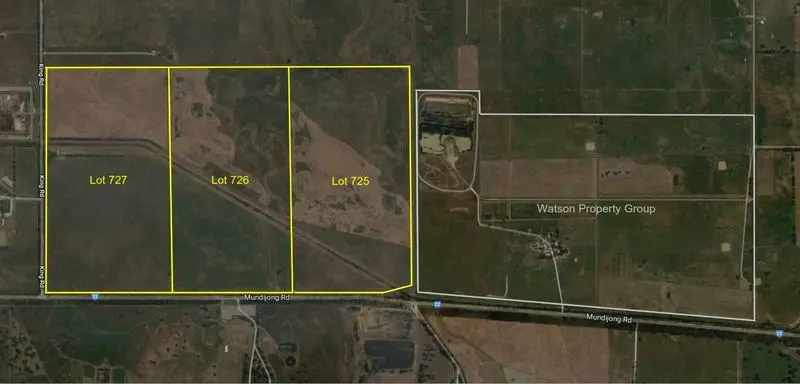

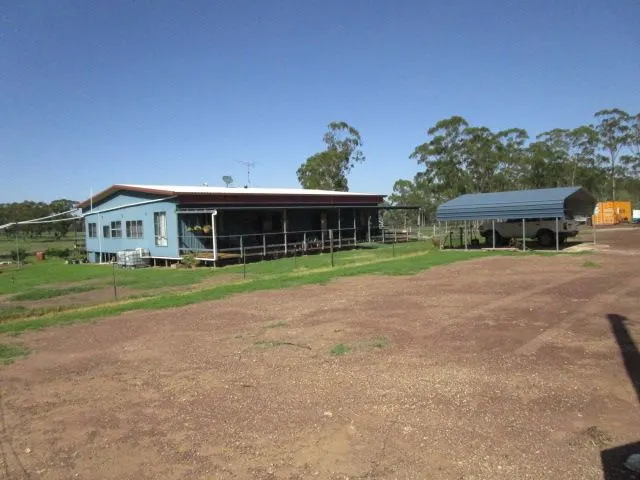

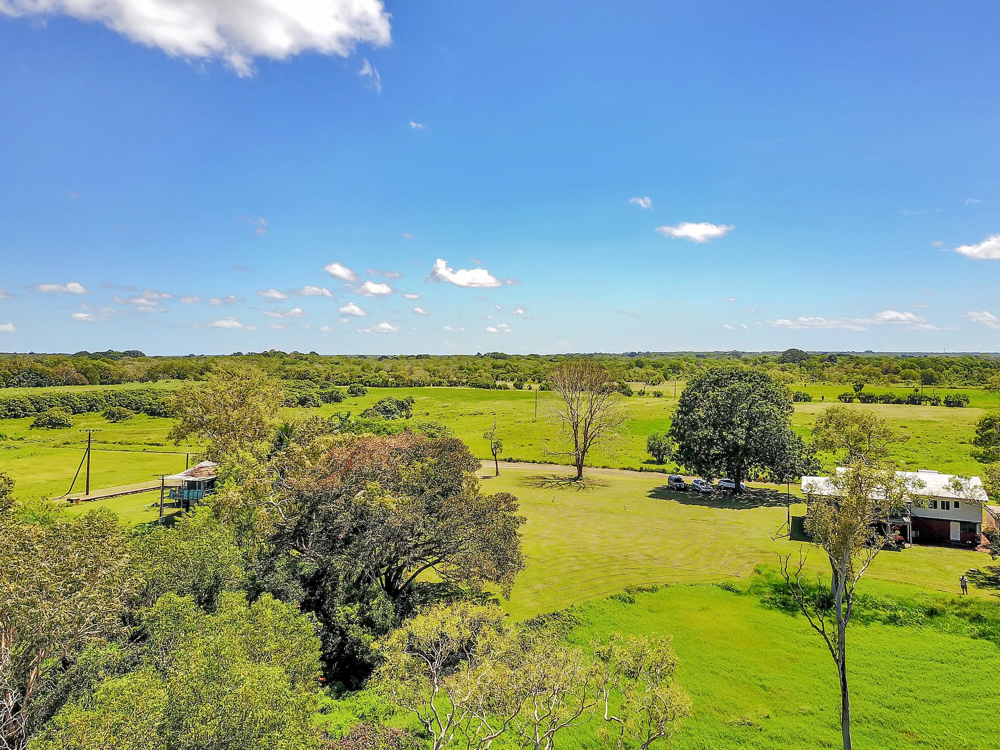

How big is a hectare?
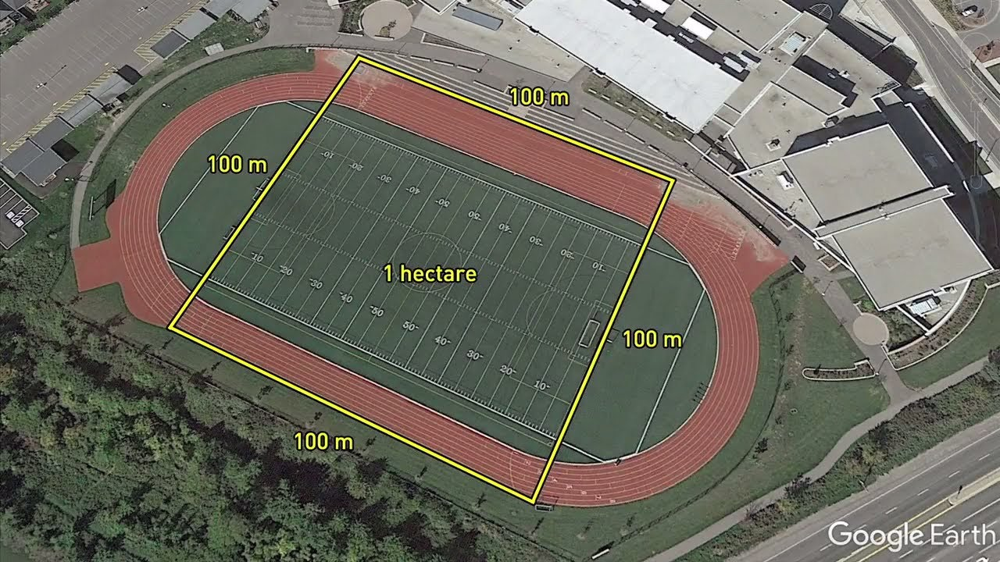

In [4]:
solar.describe()

,Area Code,Size (hectare),Price,Price / Sq Metre,Solar Exposure 2019 (MJ m-2),Convert to megawatt-hour,Solar / PSM,Unnamed: 14
count,41.000000,41.000000,4.100000e+01,41.000000,41.000000,41.000000,41.000000,0.0
mean,4110.853659,42.866341,6.171341e+05,2.434878,18.978049,0.005272,22.300000,NaN
std,2011.789931,48.872132,8.412253e+05,2.914642,2.696434,0.000749,23.480621,NaN
min,822.000000,4.800000,2.750000e+04,0.230000,14.700000,0.004083,1.370000,NaN
25%,2325.000000,12.140000,2.250000e+05,0.510000,17.200000,0.004778,6.470000,NaN
50%,4421.000000,20.480000,4.000000e+05,1.850000,17.300000,0.004806,9.990000,NaN
75%,5354.000000,47.040000,6.500000e+05,2.660000,22.100000,0.006139,33.770000,NaN
max,7330.000000,182.920000,4.750000e+06,16.230000,22.300000,0.006194,91.880000,NaN


In [5]:
solar.columns

Index(['State', 'Area Code', 'City', 'Address', 'Address Two',
       'Size (hectare)', 'sq metres', 'Price', 'Price / Sq Metre',
       'Solar Exposure 2019 (MJ m-2)', 'Convert to megawatt-hour',
       'Total Megawatt-hour', '60%', 'Solar / PSM', 'Unnamed: 14'],
      dtype='object')

In [6]:
solar.dtypes

State                            object
Area Code                         int64
City                             object
Address                          object
Address Two                      object
Size (hectare)                  float64
sq metres                        object
Price                             int64
Price / Sq Metre                float64
Solar Exposure 2019 (MJ m-2)    float64
Convert to megawatt-hour        float64
Total Megawatt-hour              object
60%                              object
Solar / PSM                     float64
Unnamed: 14                     float64
dtype: object

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11e649cd0>]],
      dtype=object)

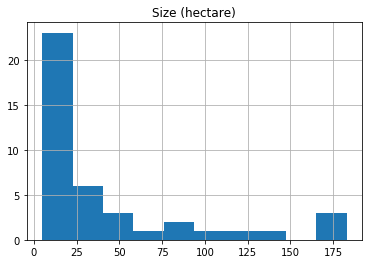

In [8]:
solar.hist(column='Size (hectare)')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11ef79110>,
      dtype=object)

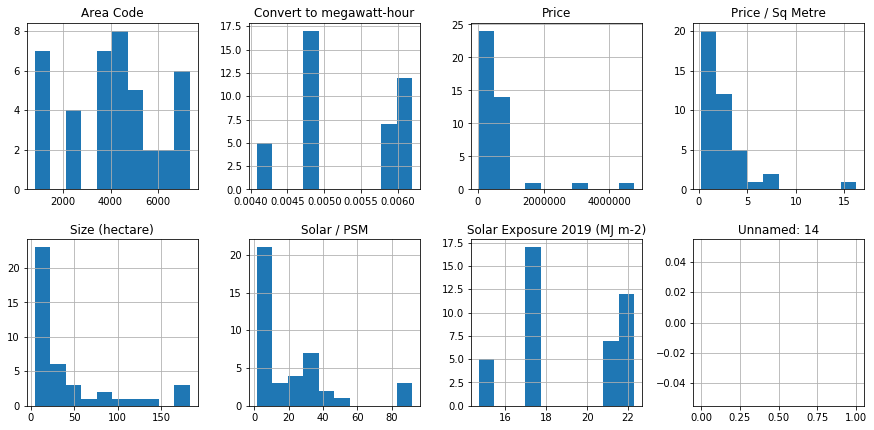

In [9]:
solar.hist(layout=(4,4), figsize=(15,15))

Is there currently a correlation between Price/SqMetre and Solar Exposure? In other words, does the land real estate account for solar exposure?

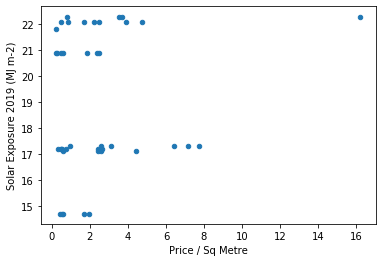

In [76]:
solar.plot.scatter(x='Price / Sq Metre', y='Solar Exposure 2019 (MJ m-2)')

Doesn't seem like it, land real estate value does not take into account sun exposure. This is perhaps where the opportunity is.

In [90]:
solar.sort_values(by=['Solar / PSM'], ascending=0)

,State,Area Code,City,Address,Address Two,Size (hectare),sq metres,Price,Price / Sq Metre,Solar Exposure 2019 (MJ m-2),Convert to megawatt-hour,Total Megawatt-hour,60%,Solar / PSM,Unnamed: 14,location,point,latitude,longitude,altitude
0,QLD,4725,Barcaldine,0 Capricorn Highway,0 Capricorn Highway Barcaldine 4725,168.59,"1,685,900",400000,0.24,21.8,0.006056,"10,209.06","6,125.44",91.88,NaN,"(Oak Street, Barcaldine, Queensland, 4725, Aus...","(-23.5523378, 145.2886116, 0.0)",-23.552338,145.288612,0.0
1,QLD,4421,Tara,42 O'Hallorans Raoad,42 O'Hallorans Raoad Tara 4421,12.00,"120,000",27500,0.23,20.9,0.005806,696.67,418.00,91.20,NaN,None,None,NaN,NaN,NaN
2,QLD,4421,Tara,183 Tregathlyn Road,183 Tregathlyn Road Tara 4421,12.00,"120,000",29999,0.25,20.9,0.005806,696.67,418.00,83.60,NaN,None,None,NaN,NaN,NaN
4,SA,5354,Fisher,21 Ballone Road,21 Ballone Road Fisher 5354,30.00,"300,000",99000,0.33,17.2,0.004778,"1,433.33",860.00,52.12,NaN,"(Ballone Road, Fisher, Mid Murray Council, Sou...","(-34.5308913, 139.4953716, 0.0)",-34.530891,139.495372,0.0
5,NT,845,Batchelor,60 Carr Road,60 Carr Road Batchelor 0845,101.17,"1,011,700",485000,0.48,22.1,0.006139,"6,210.71","3,726.43",46.10,NaN,None,None,NaN,NaN,NaN
3,QLD,4343,Ropeley,807 Ropeley Rockside Road,807 Ropeley Rockside Road Ropeley 4343,87.70,"877,000",425000,0.48,20.9,0.005806,"5,091.47","3,054.88",43.13,NaN,"(Ropeley Rockside Road, Ropeley, Toowoomba, Qu...","(-27.7101797, 152.2920258, 0.0)",-27.710180,152.292026,0.0
6,TAS,7304,Meander,0 Meander Road,0 Meander Road Meander 7304,77.15,"771,500",320000,0.41,14.7,0.004083,"3,150.29","1,890.18",35.44,NaN,"(Meander Road, Meander, Meander Valley, Tasman...","(-41.609492, 146.6262578, 0.0)",-41.609492,146.626258,0.0
7,QLD,4472,Blackall,113 Woodbine Road,113 Woodbine Road Blackall 4472,129.50,"1,295,000",770000,0.59,20.9,0.005806,"7,518.20","4,510.92",35.15,NaN,"(Woodbine Road, Blackall, Queensland, Australi...","(-24.3808807, 145.4547338, 0.0)",-24.380881,145.454734,0.0
8,SA,5434,Hawker,52 Flinders Ranges Way,52 Flinders Ranges Way Hawker 5434,180.00,"1,800,000",900000,0.50,17.2,0.004778,"8,600.00","5,160.00",34.40,NaN,"(Flinders Ranges Way, Hawker, The Flinders Ran...","(-31.8913734, 138.4244745, 0.0)",-31.891373,138.424475,0.0
9,SA,5413,Apoinga,238 Lagoon Road Apoinga,238 Lagoon Road Apoinga Apoinga 5413,30.83,"308,300",155000,0.50,17.2,0.004778,"1,472.99",883.79,34.21,NaN,"(Lagoon Road, Apoinga, The Regional Council of...","(-33.9310846, 138.9467883, 0.0)",-33.931085,138.946788,0.0


In [26]:
!pip install geopandas
!pip install geopy

     |████████████████████████████████| 931kB 2.8MB/s eta 0:00:01
     |████████████████████████████████| 13.9MB 5.1MB/s eta 0:00:01
     |████████████████████████████████| 1.6MB 6.1MB/s eta 0:00:01
     |████████████████████████████████| 11.0MB 6.0MB/s eta 0:00:01
     |████████████████████████████████| 112kB 3.1MB/s eta 0:00:01


In [88]:
from geopy.extra.rate_limiter import RateLimiter

geocode = RateLimiter(locator.geocode, min_delay_seconds=1)

solar['location'] = solar['Address Two'].apply(geocode)

solar['point'] = solar['location'].apply(lambda loc: tuple(loc.point) if loc else None)

solar[['latitude', 'longitude', 'altitude']] = pd.DataFrame(solar['point'].tolist(), index=solar.index)

In [145]:
solar.head()

,State,Area Code,City,Address,Address Two,Size (hectare),sq metres,Price,Price / Sq Metre,Solar Exposure 2019 (MJ m-2),Convert to megawatt-hour,Total Megawatt-hour,60%,Solar / PSM,Unnamed: 14,location,point,latitude,longitude,altitude
0,QLD,4725,Barcaldine,0 Capricorn Highway,0 Capricorn Highway Barcaldine 4725,168.59,"1,685,900",400000,0.24,21.8,0.006056,"10,209.06","6,125.44",91.88,NaN,"(Oak Street, Barcaldine, Queensland, 4725, Aus...","(-23.5523378, 145.2886116, 0.0)",-23.552338,145.288612,0.0
1,QLD,4421,Tara,42 O'Hallorans Raoad,42 O'Hallorans Raoad Tara 4421,12.00,"120,000",27500,0.23,20.9,0.005806,696.67,418.00,91.20,NaN,None,None,0.000000,0.000000,NaN
2,QLD,4421,Tara,183 Tregathlyn Road,183 Tregathlyn Road Tara 4421,12.00,"120,000",29999,0.25,20.9,0.005806,696.67,418.00,83.60,NaN,None,None,0.000000,0.000000,NaN
3,QLD,4343,Ropeley,807 Ropeley Rockside Road,807 Ropeley Rockside Road Ropeley 4343,87.70,"877,000",425000,0.48,20.9,0.005806,"5,091.47","3,054.88",43.13,NaN,"(Ropeley Rockside Road, Ropeley, Toowoomba, Qu...","(-27.7101797, 152.2920258, 0.0)",-27.710180,152.292026,0.0
4,SA,5354,Fisher,21 Ballone Road,21 Ballone Road Fisher 5354,30.00,"300,000",99000,0.33,17.2,0.004778,"1,433.33",860.00,52.12,NaN,"(Ballone Road, Fisher, Mid Murray Council, Sou...","(-34.5308913, 139.4953716, 0.0)",-34.530891,139.495372,0.0


In [105]:
solar.isnull().sum()

State                            0
Area Code                        0
City                             0
Address                          0
Address Two                      0
Size (hectare)                   0
sq metres                        0
Price                            0
Price / Sq Metre                 0
Solar Exposure 2019 (MJ m-2)     0
Convert to megawatt-hour         0
Total Megawatt-hour              0
60%                              0
Solar / PSM                      0
Unnamed: 14                     41
location                        13
point                           13
latitude                        13
longitude                       13
altitude                        13
dtype: int64

In [109]:
null_mask = solar['latitude'].isnull()
solar.loc[null_mask, 'latitude'] = 0
solar.isnull().sum()

State                            0
Area Code                        0
City                             0
Address                          0
Address Two                      0
Size (hectare)                   0
sq metres                        0
Price                            0
Price / Sq Metre                 0
Solar Exposure 2019 (MJ m-2)     0
Convert to megawatt-hour         0
Total Megawatt-hour              0
60%                              0
Solar / PSM                      0
Unnamed: 14                     41
location                        13
point                           13
latitude                         0
longitude                       13
altitude                        13
dtype: int64

In [110]:
null_mask = solar['longitude'].isnull()
solar.loc[null_mask, 'longitude'] = 0
solar.isnull().sum()

State                            0
Area Code                        0
City                             0
Address                          0
Address Two                      0
Size (hectare)                   0
sq metres                        0
Price                            0
Price / Sq Metre                 0
Solar Exposure 2019 (MJ m-2)     0
Convert to megawatt-hour         0
Total Megawatt-hour              0
60%                              0
Solar / PSM                      0
Unnamed: 14                     41
location                        13
point                           13
latitude                         0
longitude                        0
altitude                        13
dtype: int64

In [94]:
!pip install folium
import folium

In [190]:
def generateBaseMap(default_location=[37.76, -122.45], default_zoom_start=4):
    '''
    Create a base map
    '''
    base_map = folium.Map(
        location = default_location
        , control_scale = True
        , zoom_start = default_zoom_start
    )
    return base_map

In [191]:
base_map = generateBaseMap(default_location=[-24.003064,134.629882])
display(base_map)

In [192]:
for i in range(0,len(solar)):
    folium.Marker(
        location=[solar.iloc[i]['latitude'], solar.iloc[i]['longitude']],
        popup=solar.iloc[i]['Solar / PSM']
    ).add_to(base_map)

display(base_map)

In [195]:
for i in range(0,len(solar)):
    folium.Circle(
        location=[solar.iloc[i]['latitude'], solar.iloc[i]['longitude']],
        popup=solar.iloc[i]['Solar / PSM'],
        radius=solar.iloc[i]['Solar / PSM']*3000,
        color='crimson',
        fill=True,
        fill_color='crimson'
    ).add_to(base_map)

display(base_map)